<h1> Malaria Forecasting</h1>

In [2]:
from __future__ import division
import numpy as np
import json
import re
import gzip
import pandas as pd
%pylab inline
pylab.rcParams['figure.figsize'] = (12.0, 8.0) # set size of figures"
plt.rcParams.update({'font.size': 24})
import seaborn as sns
import datetime
from ethiopian_date import ethiopian_date
from collections import defaultdict
import os 
from matplotlib.colors import LogNorm

# Plotting code
from plot_util import *

# Modeles:

from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, Lasso, ARDRegression
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

Populating the interactive namespace from numpy and matplotlib


<h1> Load in the processed data </h1>

In [7]:
filepath = 'Malaria_regional_3-24-2017.csv'
DF_ind = pd.read_csv(filepath, index_col=0).reset_index(drop=True)

# Convert string to datetime
DF_ind['Real_Date'] = pd.to_datetime(DF_ind['Real_Date'])
DF_ind['E_Date'] = pd.to_datetime(DF_ind['E_Date'])
# list of indicator names
indicators = DF_ind['Indicator'].unique()
indicators

array(['Number of slides or RDT positive for malaria < 5 years: Males',
       'Number of slides or RDT positive for malaria < 5 years: Females',
       'Number of slides or RDT positive for malaria 5-14 years: Males',
       'Number of slides or RDT positive for malaria 5-14 years: Females',
       'Number of slides or RDT positive for malaria >=15 years: Males',
       'Number of slides or RDT positive for malaria >=15 years: Females'], dtype=object)

In [3]:
DF_ind.head()

,Real_Date,Indicator_id,val,Region,Indicator,is_male,is_child,is_teen,is_male_child,is_female_child,...,is_dire dawa,is_gambella,is_harari,is_oromiya,is_snnpr,is_somali,is_tigray,sg_val,log_val,log_sg_val
0,2014-07-08,hmis_indicator_3199,767.0,afar,Number of slides or RDT positive for malaria <...,1,1,0,1,0,...,0,0,0,0,0,0,0,596.812121,2.885361,2.776565
1,2014-08-07,hmis_indicator_3199,613.0,afar,Number of slides or RDT positive for malaria <...,1,1,0,1,0,...,0,0,0,0,0,0,0,856.836364,2.788168,2.933404
2,2014-09-06,hmis_indicator_3199,1076.0,afar,Number of slides or RDT positive for malaria <...,1,1,0,1,0,...,0,0,0,0,0,0,0,1069.048918,3.032216,3.029404
3,2014-10-11,hmis_indicator_3199,1218.0,afar,Number of slides or RDT positive for malaria <...,1,1,0,1,0,...,0,0,0,0,0,0,0,1233.449784,3.086004,3.091473
4,2014-11-10,hmis_indicator_3199,1399.0,afar,Number of slides or RDT positive for malaria <...,1,1,0,1,0,...,0,0,0,0,0,0,0,1350.038961,3.146128,3.130668


<h1> Visualize the data for each indicator </h1>

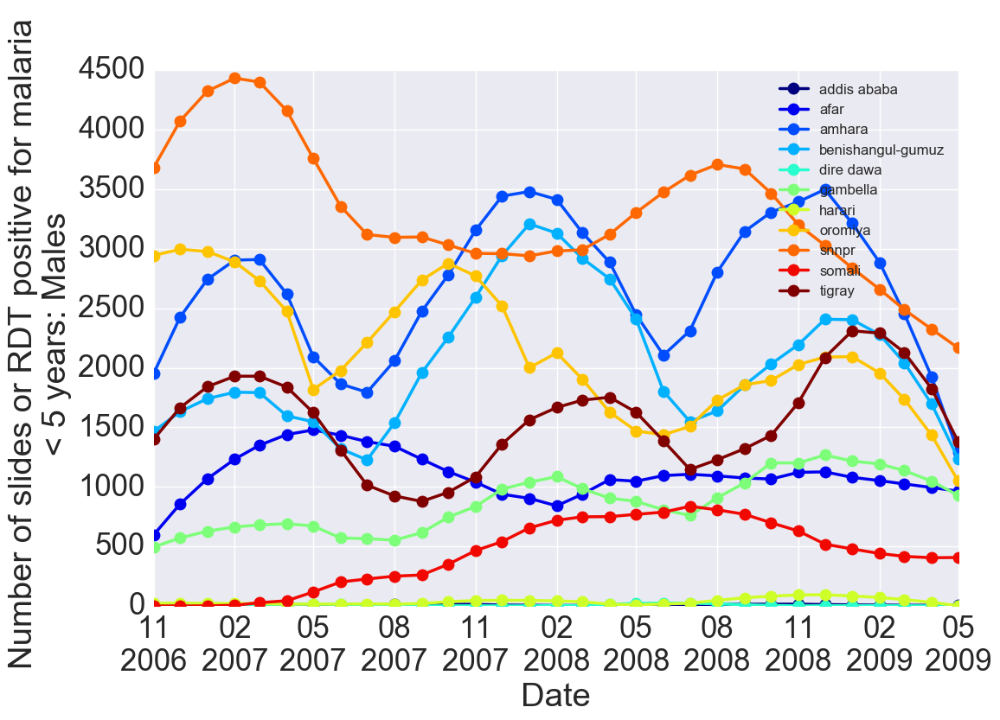

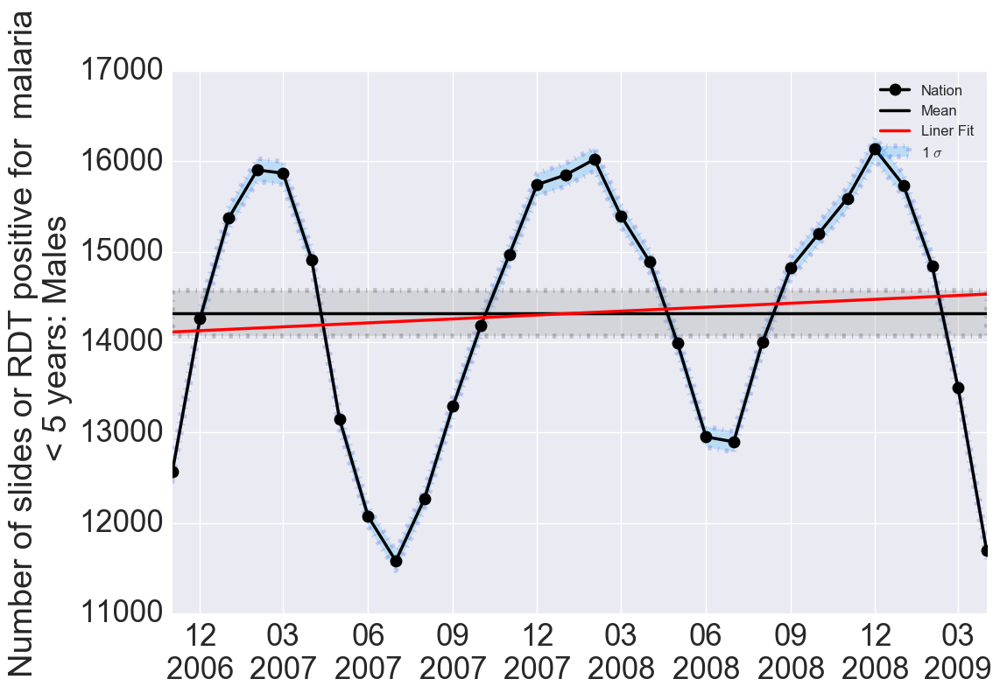

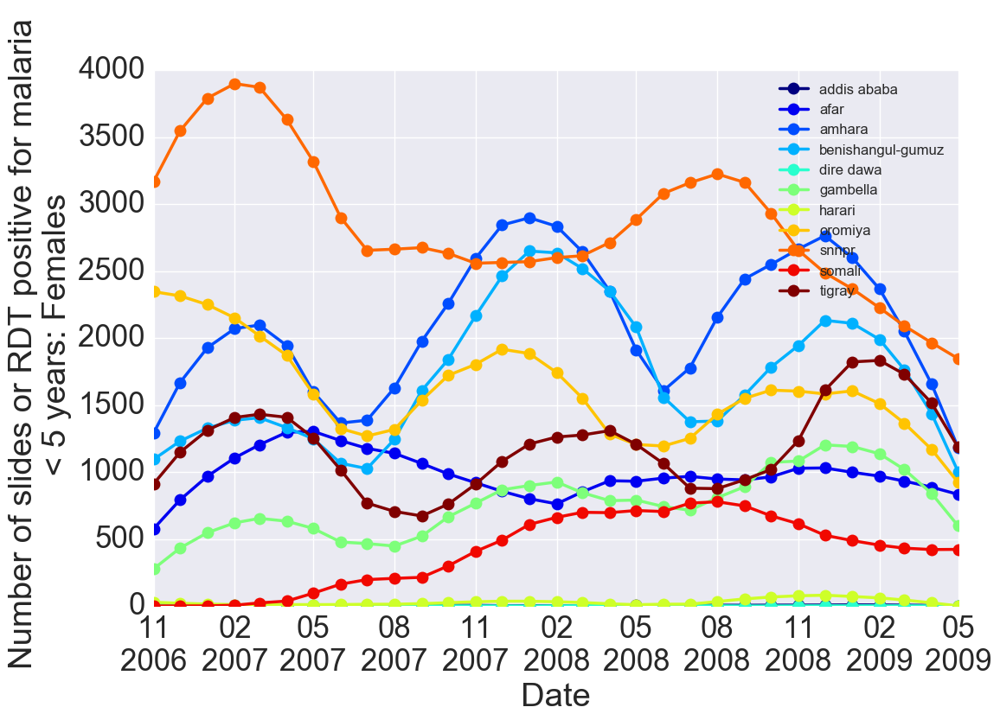

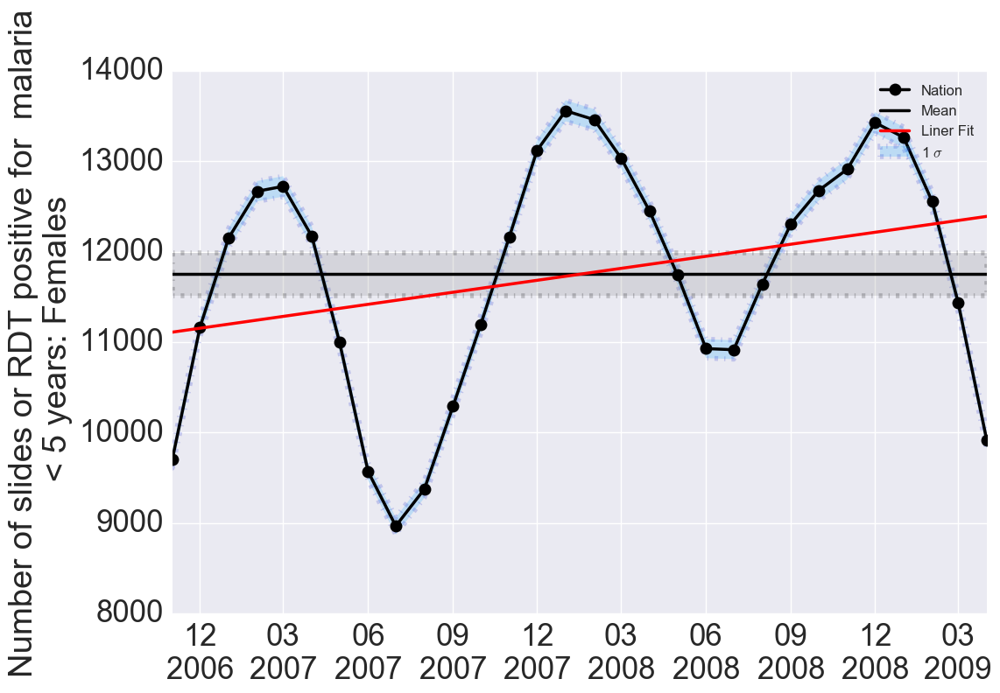

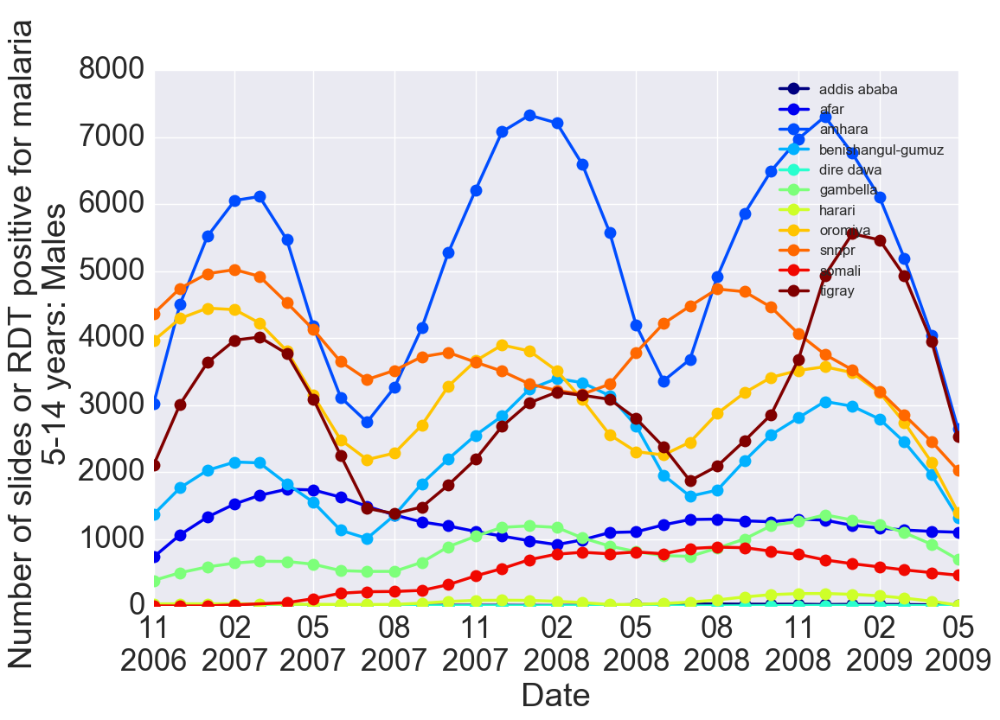

...

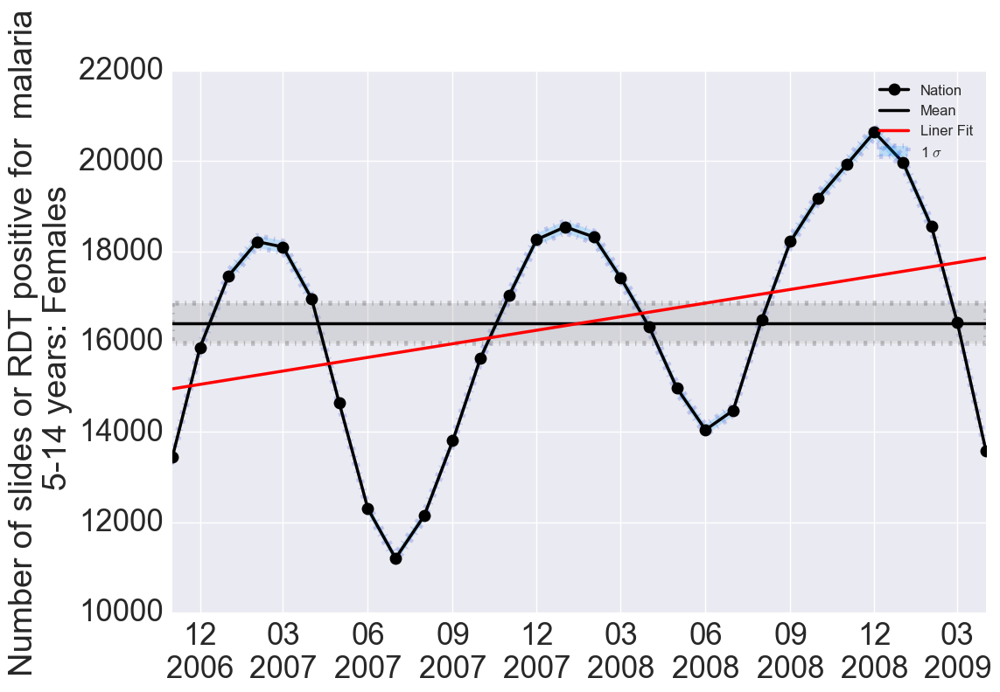

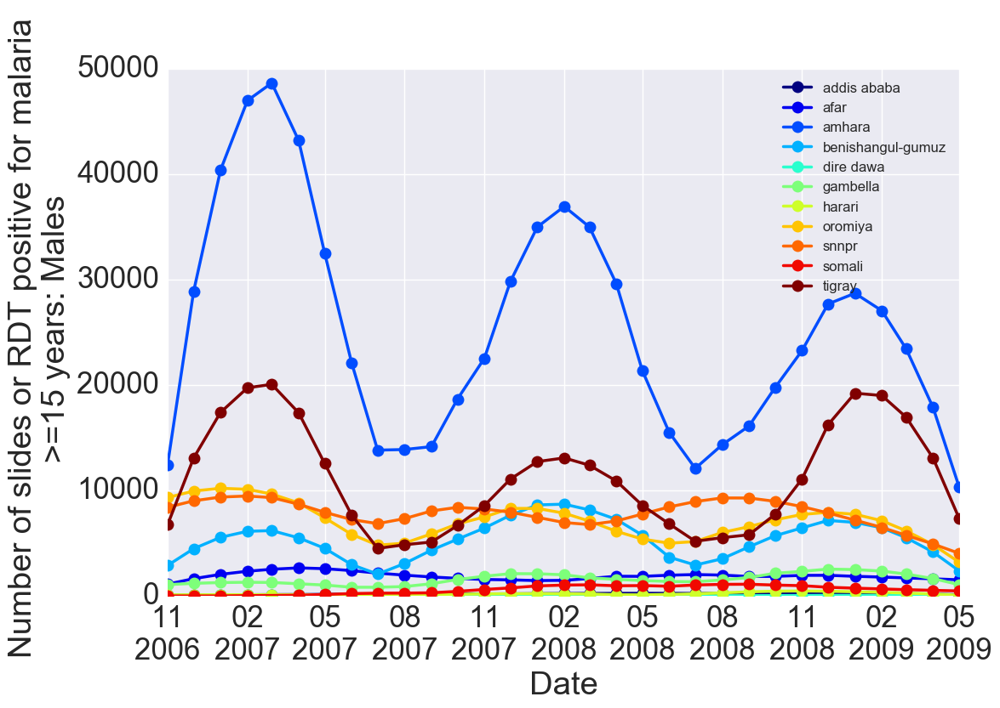

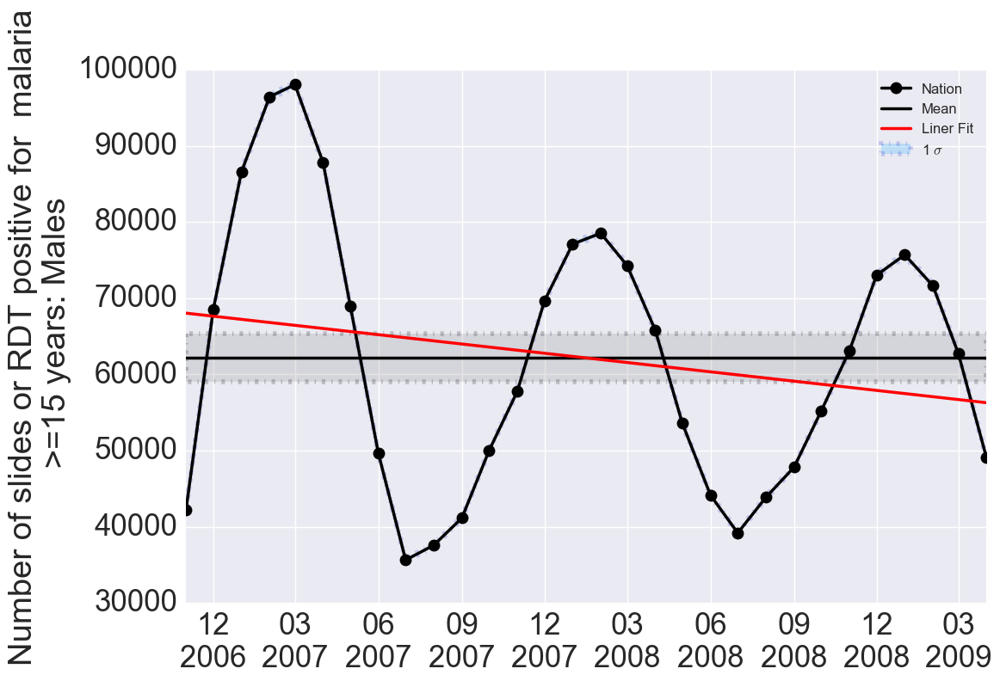

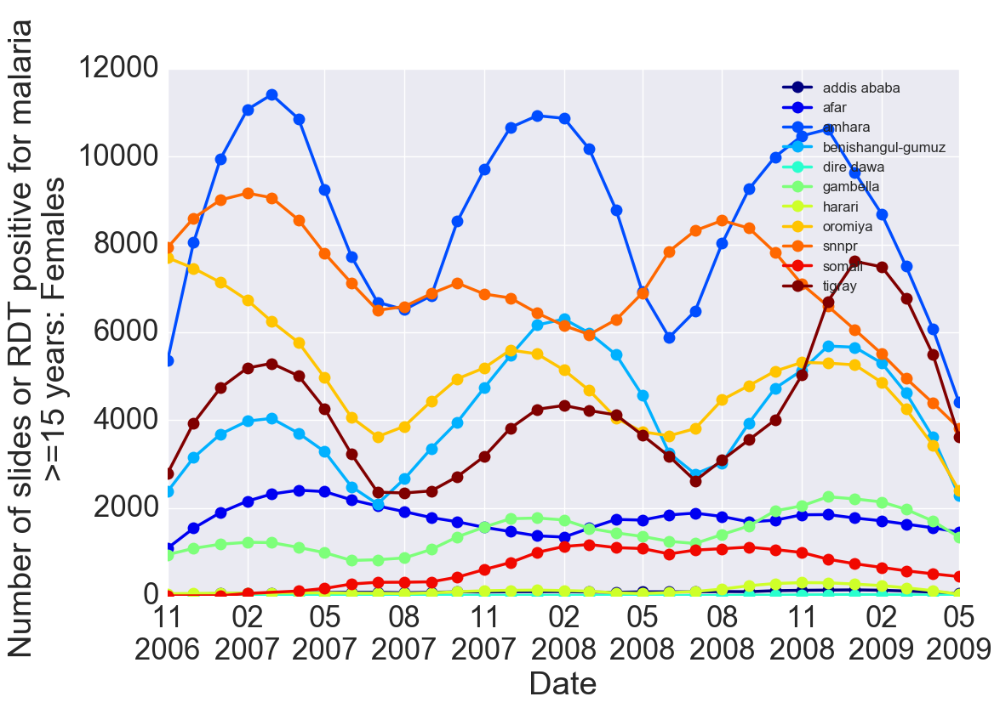

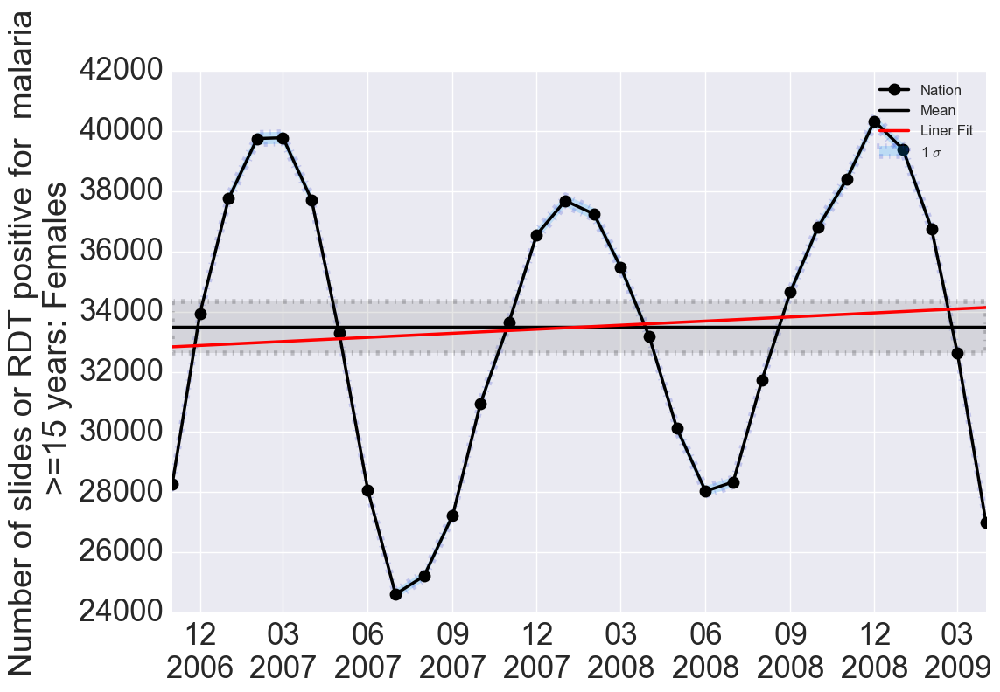

In [5]:
for indicator in indicators:
    series_d = plot_date_indicator(DF_ind, indicator, val_name='sg_val')
    series_d = plot_date_indicator_nation(DF_ind, indicator, date_type='E_Date', \
                val_name='sg_val', plt_mean=True, plt_err=True, plt_mean_std=True, x_range=[0,-1])

<h1> Setup predictive model </h1>

In [8]:
# Use two or three previous values?
months = 1

In [9]:
cols_to_shift = ['val', 'log_val', 'sg_val', 'log_sg_val', 'infection_rate', 'Region', 'Indicator']
for i in range(1, 3 + months):
    suffixes = ('', '_shift_%s' % i)
    DF_ind = DF_ind.merge(DF_ind[cols_to_shift].shift(i), left_index=True, right_index=True, how='left', suffixes=suffixes)

#DF_ind['sg_val_delta'] = (DF_ind['sg_val'] - DF_ind['sg_val_shift_1']) / DF_ind['sg_val_shift_1']
    
# Cut out locations were shift doesn't overlap
DF_shift = DF_ind[(DF_ind['Region'] == DF_ind['Region_shift_%s' % i]) &\
                    (DF_ind['Indicator'] == DF_ind['Indicator_shift_%s' % i])]


<h1> build several models to prevent overfitting</h1>

<h3> National level average error </h3>

<h3> National all indicators. RMSE on testing set </h3>

In [10]:
def plot_nation_rmse(tests, target, end_date, savedir=None):
    rmse_data = {}
    fig=figure()
    fig.set_size_inches(8, 6)
    
    for i in range(1, len(tests)):
        pred_text = 'prediction_m_%s' % (i*6)
        DF_testing = pd.concat(tests[i], ignore_index=True)
        DF_testing = DF_testing[DF_testing['E_Date'] < end_date]

        # Sum over all the regions that make up the national indicator... after the sum, groupby by level 0
        nation_rmse = DF_testing.groupby(['Indicator', 'Real_Date']).sum()\
            .groupby(level=0).apply(lambda x: np.sqrt((((x[target] - x[pred_text]) / x[target])**2).mean()))

        nation_rmse.index = [val.split('malaria')[-1] for val in nation_rmse.index]
        nation_rmse.plot.bar(color='r', alpha=0.5)
        rmse_data.update({'nation_rmse_m%s' % (i*6): nation_rmse})

        if savedir:
            plt.savefig('%s/Nation_RMSE_m%s.png' % (savedir, (i*6)))

    return rmse_data

<h1> Regional level RMSE </h1>

In [11]:
def plot_region_rmse(tests, target, end_date, savedir=None):
    rmse_data = {}
    for i in range(1, len(tests)):
        pred_text = 'prediction_m_%s' % (i*6)
        DF_testing = pd.concat(tests[i], ignore_index=True)
        DF_testing = DF_testing[DF_testing['E_Date'] < end_date]
        
        fig=figure()
        fig.set_size_inches(8, 6)

        # Sum over all the regions that make up the national indicator... after the sum, groupby by level 0
        region_rmse = DF_testing.replace(0,1).groupby(['Region', 'Indicator'])\
            .apply(lambda x: np.sqrt((((x[target] - x[pred_text]) / x[target])**2).mean()))

        result = region_rmse.reset_index().pivot(index='Region', columns='Indicator', values=0).replace(np.nan,0)
        result.columns=[val.split('malaria')[-1] for val in result.columns]
        
        sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
        sns.heatmap(result, annot=True, fmt=".2f", cmap='viridis', label='big',\
                    square=False,linewidths=0.1, cbar=False, norm=LogNorm(vmin=result.min(), vmax=result.max()))
        
        rmse_data.update({'region_rmse_m%s' % (i*6): region_rmse})
        
        if savedir:
            plt.savefig('%s/Region_RMSE_m%s.png' % (savedir, (i*6)))
    return rmse_data

<h1> Single model for all regions. 1 month and three months </h1>

In [636]:
regions = DF_ind['Region'].unique()
indicators = DF_ind['Indicator'].unique()

M = 1

emonth_list = ['is_emonth_%s' % i for i in range(1, 13)]
region_list = ['is_%s' % region for region in regions]
precip_list = ['precipitation_shift_%s' % i for i in range(M, 4)]
wind_list = ['wind_avg_shift_%s' % i for i in range(M, 4)]
temp_list = ['temp_avg_shift_%s' % i for i in range(M, 4)]
humid_list = ['humid_avg_shift_%s' % i for i in range(M, 4)]
solar_list = ['solar_shift_%s' % i for i in range(M, 4)]

val_list = ['sg_val_shift_%s' % i for i in range(M, 4)]
infec_rate_list = ['infection_rate_shift_%s' % i for i in range(M, 4)]

region_info = ['is_male', 'is_teen', 'is_child', 'rate_is_high', 'net_frac', 'pop', \
               'minElevation_m', 'Elevation_m', 'Area_km2', 'density']


features = emonth_list + region_list +  precip_list + wind_list + temp_list + humid_list + solar_list \
            + val_list + infec_rate_list + region_info

target = 'sg_val'

#RF = ARDRegression()
#RF = LinearRegression()
#RF = Ridge (alpha = 0.01)
RF = BayesianRidge()
#RF = Lasso()
#RF = RandomForestRegressor(n_estimators=50, warm_start=False)
#RF = GradientBoostingRegressor(subsample=0.1)

end_date = pd.datetime(2009, 4, 1)# Dec 2016
pred_shifts = range(0, 13, 6)

trains = defaultdict(list)
tests = defaultdict(list)
pred_m3 = defaultdict(list)
DF_shift_all = DF_shift.copy()

for i, offset in enumerate(pred_shifts):
    DF_training = DF_shift[DF_shift['E_Date'] < \
                end_date - pd.offsets.relativedelta(months=offset)]
    DF_testing = DF_shift.drop(DF_training.index)
    
    poststr = ''
    if offset != 0:
        poststr = '_m_%s' % offset
    prediction_str = 'prediction%s' % poststr
    
    # Training:
    y = DF_training[target].values
    xtrain = DF_training[features].values
    RF.fit(xtrain, y)

    DF_training[prediction_str] = RF.predict(xtrain) #* DF_training['sg_val_shift_1'] + DF_training['sg_val_shift_1']
    trains[i].append(DF_training)


    # Testing:
    xtest = DF_testing[features].values
    DF_testing[prediction_str] = RF.predict(xtest) #* DF_testing['sg_val_shift_1'] + DF_testing['sg_val_shift_1']
    tests[i].append(DF_testing)


    #Make predictions one month forward
    x_all = DF_shift_all[features].values
    DF_shift_all[prediction_str] = RF.predict(x_all) #* DF_shift_all['sg_val_shift_1'] + DF_shift_all['sg_val_shift_1']

    # Make predictions three months forward
    '''if offset > 0:
        for mstep in range(0, offset+1)[::-1]:
            DF_end_cut = pd.DataFrame(DF_shift[DF_shift['E_Date'] < \
                    end_date - pd.offsets.relativedelta(months=mstep)])

            ext_DF, forecast_DF = forecast(DF_end_cut, RF, n_months=3)
            # Add dataframe with the last forecast date to list. This will build the +3 month forecast DF.
            pred_m3[i].append(forecast_DF[forecast_DF['E_Date'] == forecast_DF['E_Date'].max()].reset_index())'''
    # Itterativley forecast forward one year
    #if offset == 0:
    #    ext_DF, projection_DF = forecast(DF_training, RF, n_months=6)
    #    projection_DF.reset_index(inplace=True)


/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [12]:
def plot_feature_imp(feature_imp, ylog=False):
    figure()
    sorted_index = sorted(range(len(feature_imp)),key=lambda x:feature_imp[x], reverse=True)
    xx = range(len(feature_imp))
    plt.bar(xx, feature_imp[sorted_index])
    xticks(xx, [features[i] for i in sorted_index], rotation = 'vertical')
    ylabel('Feature Importance')
    if ylog:
        yscale('log')

<h1> Make a model for each region </h1>

In [13]:
def check_neg(predictions):
    return np.array([int(pred) if pred >= 0 else 1 for pred in predictions])

regions = DF_ind['Region'].unique()
indicators = DF_ind['Indicator'].unique()

In [14]:
addis = ['addis ababa']
dire = ['dire dawa']
harari = ['harari']
others = [region for region in regions if region not in addis + dire + harari]
region_groups = [addis, dire, harari, others]


<h3> Normalize all coeff to 1 </h3>

In [226]:
DF_normed = (DF_shift[features] / DF_shift[features].max()).replace(np.nan, 0)\
.join(DF_shift[['E_Date', 'Real_Date', 'Region', 'Indicator', 'val', 'sg_val']])

In [16]:
# M nominally starts at 1. The model uses data from one month back. 
# Can add partial weather data from current month eventually
M = 1
val_max = M + 3
w_max = M + 3
end_date = pd.datetime(2009, 4, 1)# (2009, 4, 1) = Dec 2016
pred_shifts = range(0, 13, 6)

emonth_list = ['is_emonth_%s' % i for i in range(1, 13)]
region_list = ['is_%s' % region for region in regions]
precip_list = ['precipitation_shift_%s' % i for i in range(M, w_max)]
days_precip_list = ['days_precipitation_shift_%s' % i for i in range(M, w_max)]
wind_list = ['wind_avg_shift_%s' % i for i in range(M, w_max)]
temp_list = ['temp_min_shift_%s' % i for i in range(M, w_max)]
temp_list = ['temp_max_shift_%s' % i for i in range(M, w_max)]
humid_list = ['humid_avg_shift_%s' % i for i in range(M, w_max)]
solar_list = ['solar_shift_%s' % i for i in range(M, w_max)]

val_list = ['sg_val_shift_%s' % i for i in range(M, val_max)]
infec_rate_list = ['infection_rate_shift_%s' % i for i in range(M, val_max)]

gender_age_info = ['is_male_child', 'is_female_child', 'is_male_teen', 'is_female_teen', 'is_male_adult']
#gender_age_info = ['is_male', 'is_teen', 'is_child']

region_info = ['net_frac', 'pop', 'minElevation_m', 'Elevation_m', 'Area_km2', 'density']

# Use for LR
#features = emonth_list +  region_list + precip_list + wind_list + temp_list + humid_list + solar_list \
#            + val_list + infec_rate_list
    
features = emonth_list + region_list +  precip_list + wind_list + temp_list + humid_list \
                + solar_list + val_list + infec_rate_list + region_info + gender_age_info
    
#features =  gender_age_info + val_list

target = 'val'

#RF = LinearRegression()
#RF = Ridge()
RF = BayesianRidge(n_iter=300)
#RF = Lasso()
#RF = RandomForestRegressor(n_estimators=100, warm_start=False)
#RF = GradientBoostingRegressor()

trains = defaultdict(list)
tests = defaultdict(list)
shifts = []
pred_m3 = defaultdict(list)

#for region in regions:
#region_cut = [region in region_group for region in DF_shift['Region']]
for region_group in region_groups:
    region_cut = [region in region_group for region in DF_shift['Region']]
    DF_shift_region = DF_shift[region_cut].copy()
    DF_shift_region_cut = DF_shift[region_cut].copy()
    #Normed
    #DF_shift_region = DF_normed[region_cut].copy()
    #DF_shift_region_cut = DF_normed[region_cut].copy()
    
    for i, offset in enumerate(pred_shifts):
        DF_training = DF_shift_region_cut[DF_shift_region_cut['E_Date'] < \
                    end_date - pd.offsets.relativedelta(months=offset)]
        DF_testing = DF_shift_region_cut.drop(DF_training.index)

        poststr = ''
        if offset != 0:
            poststr = '_m_%s' % offset
        prediction_str = 'prediction%s' % poststr

        # Training:
        y = DF_training[target].values
        xtrain = DF_training[features].values
        RF.fit(xtrain, y)
        #plot_feature_imp(RF.coef_)

        DF_training[prediction_str] = check_neg(RF.predict(xtrain)) #* DF_training['sg_val_shift_1'] + DF_training['sg_val_shift_1']
        trains[i].append(DF_training)


        # Testing:
        xtest = DF_testing[features].values
        DF_testing[prediction_str] = check_neg(RF.predict(xtest)) #* DF_testing['sg_val_shift_1'] + DF_testing['sg_val_shift_1']
        tests[i].append(DF_testing)


        #Make predictions one month forward
        x_all = DF_shift_region[features].values
        DF_shift_region[prediction_str] = check_neg(RF.predict(x_all)) #* DF_shift_all['sg_val_shift_1'] + DF_shift_all['sg_val_shift_1']
    
        
    shifts.append(DF_shift_region)
DF_shift_all = pd.concat(shifts, ignore_index=True)



/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


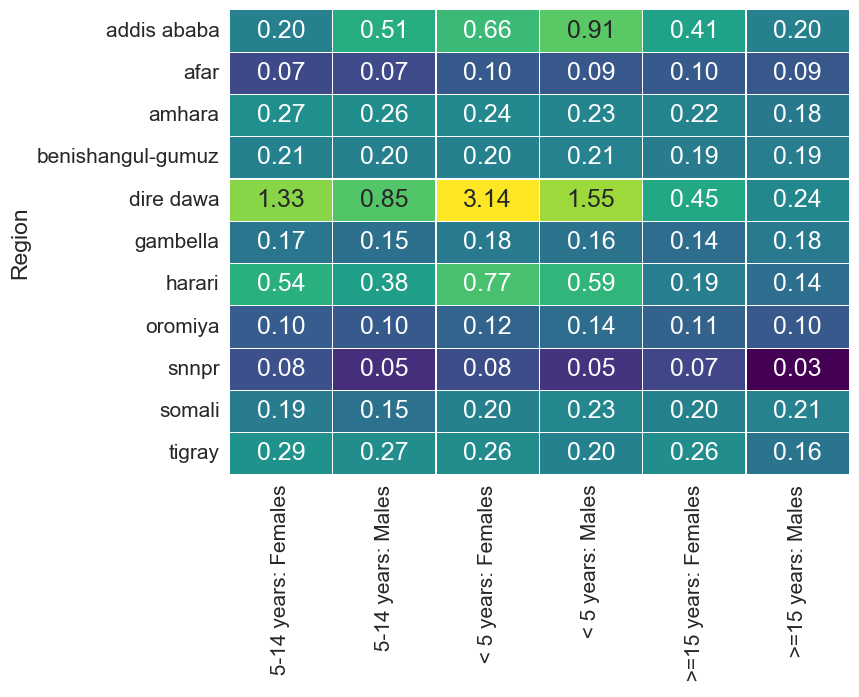

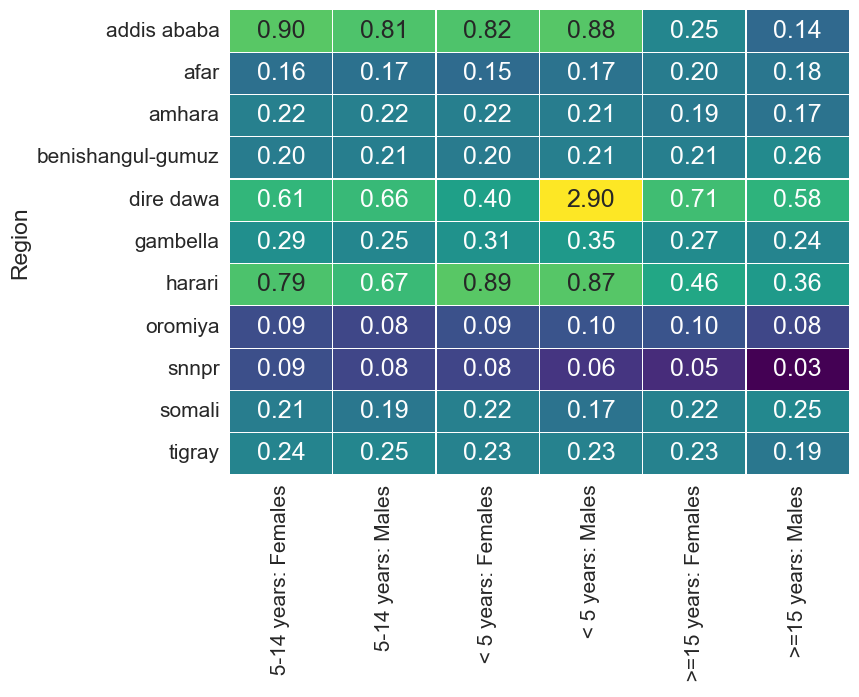

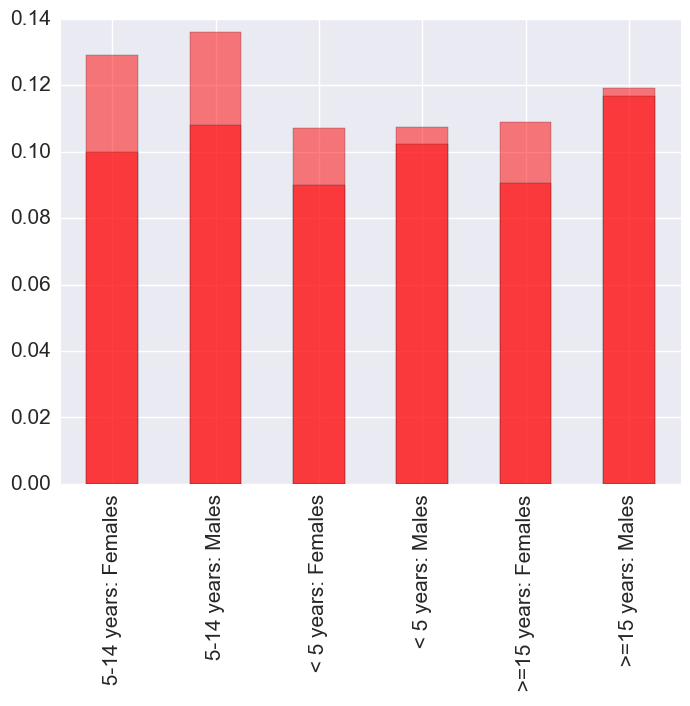

In [17]:
savedir = 'Bayes_region_groups_malaria_1m'
if not os.path.exists(savedir):
    os.mkdir(savedir)

region_rmse = plot_region_rmse(tests, 'val', end_date, savedir=None)
nation_rmse = plot_nation_rmse(tests, 'val', end_date, savedir=None)

<h1> plot and save figures </h1>

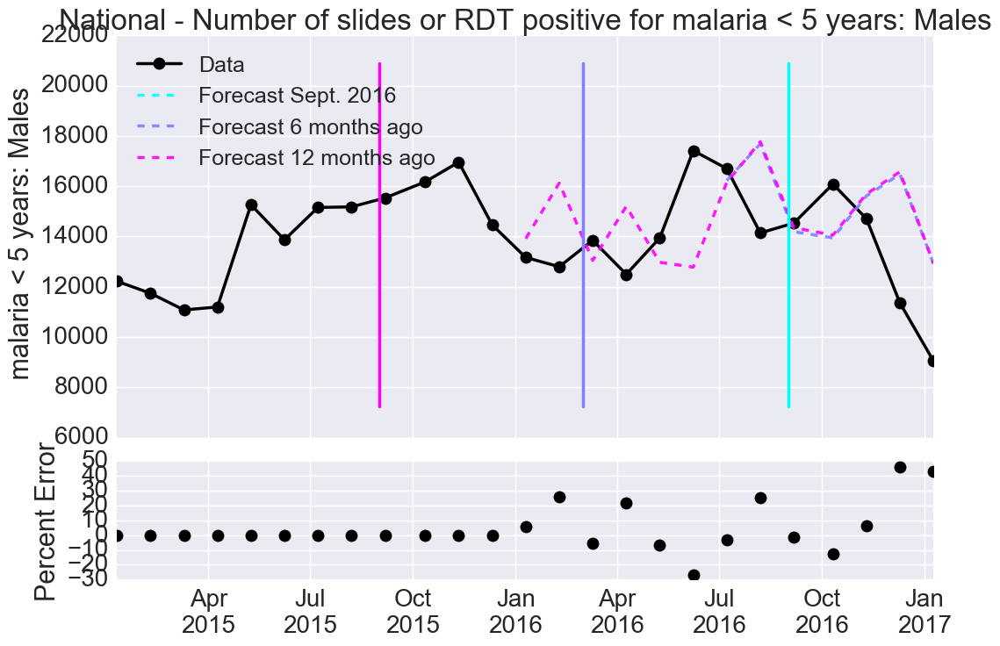

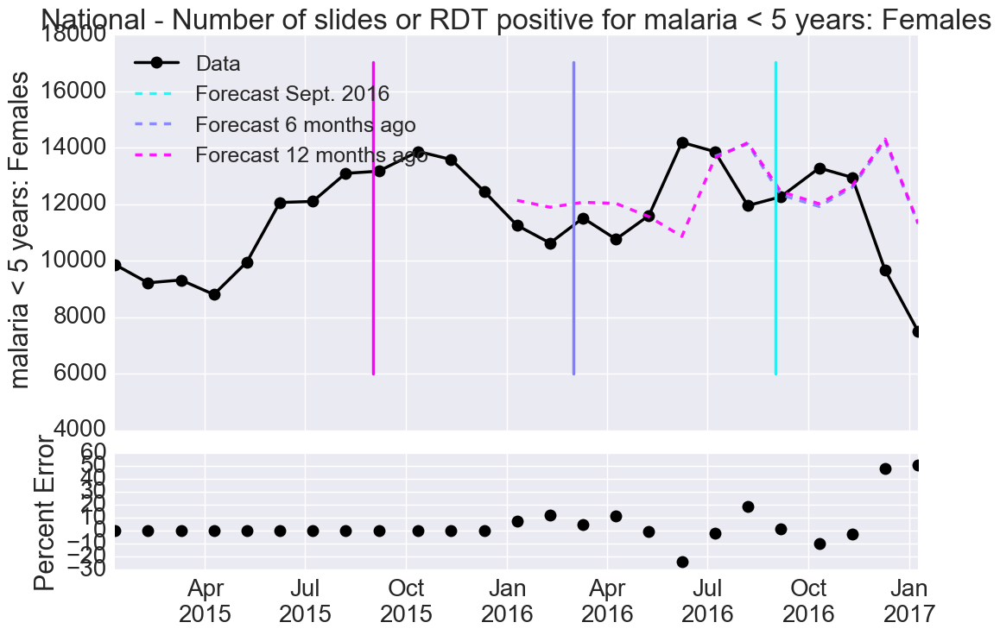

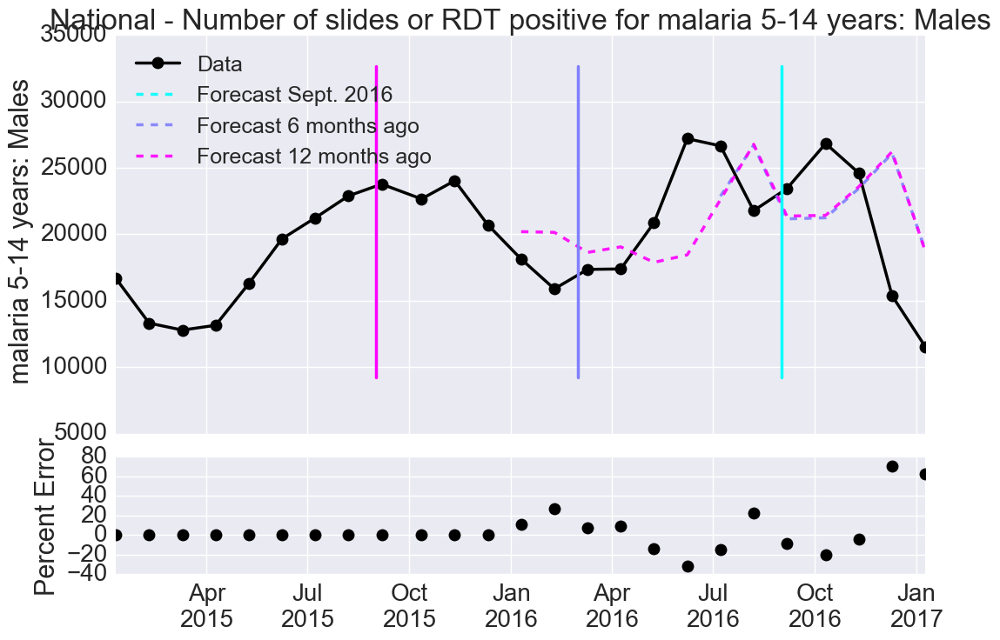

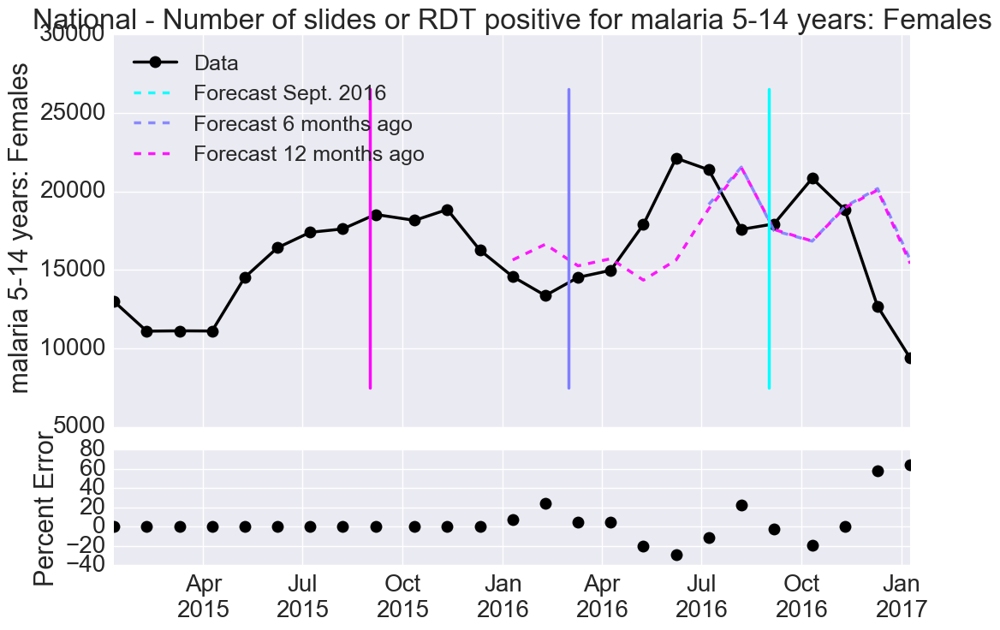

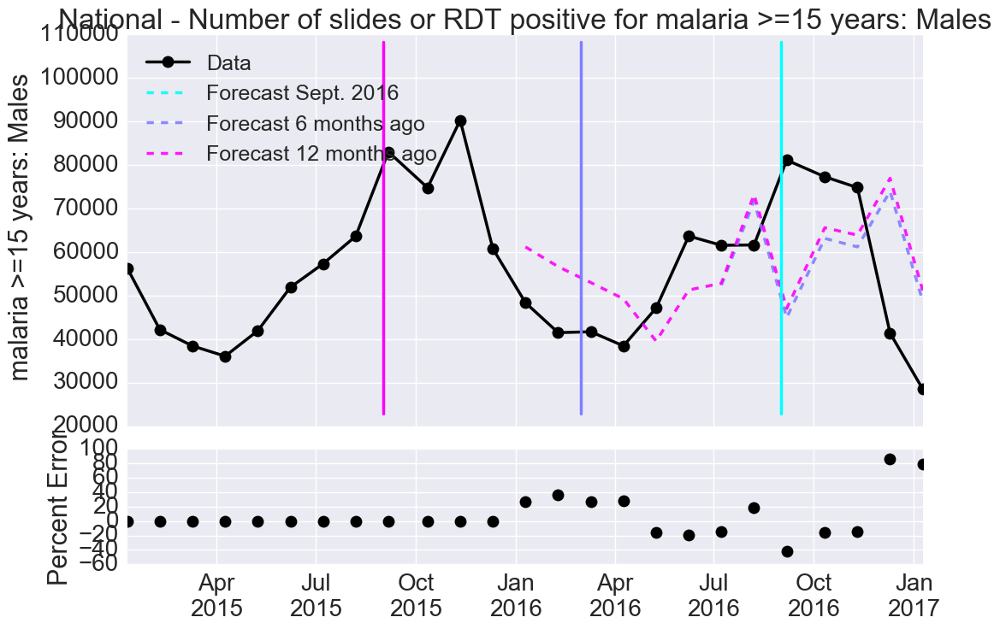

...

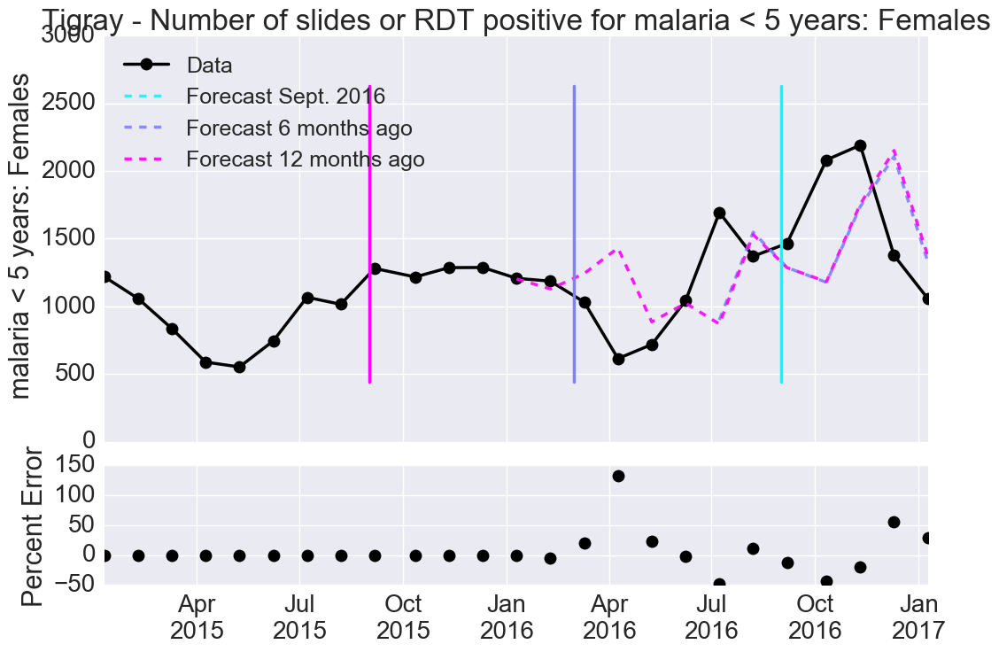

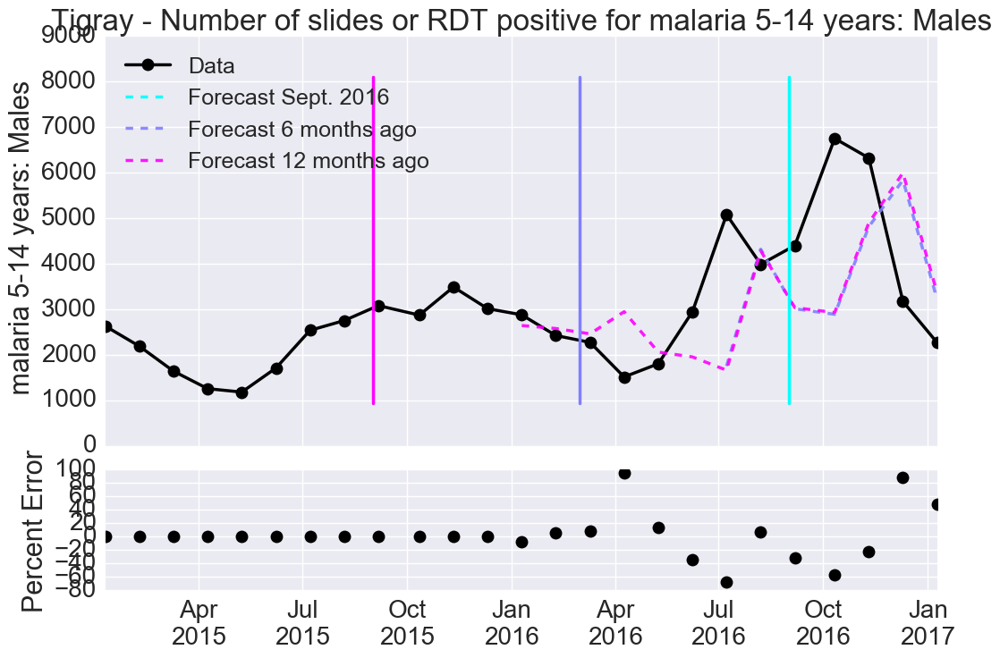

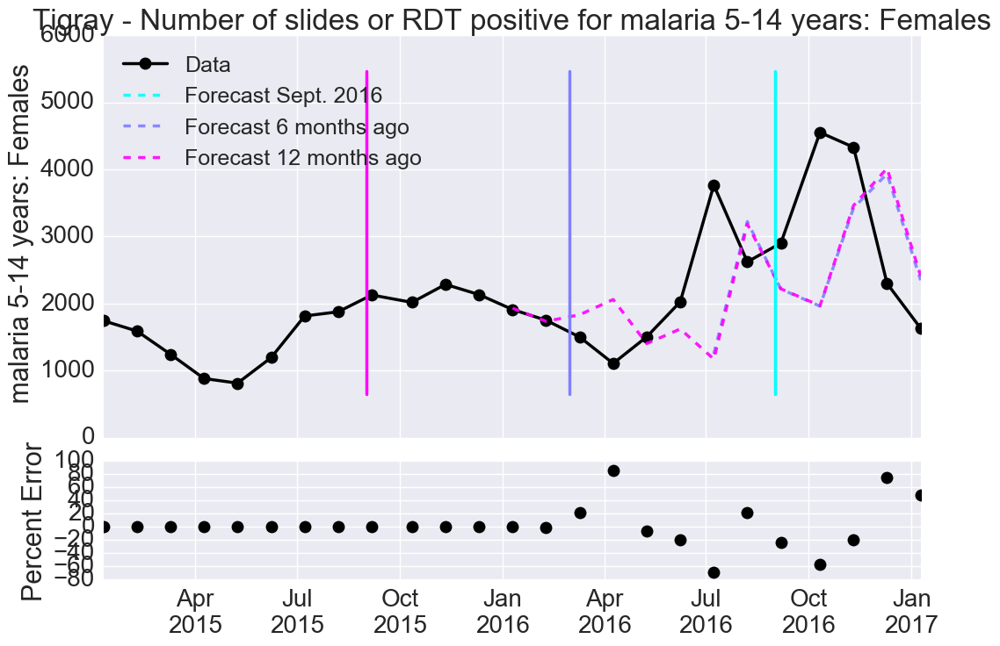

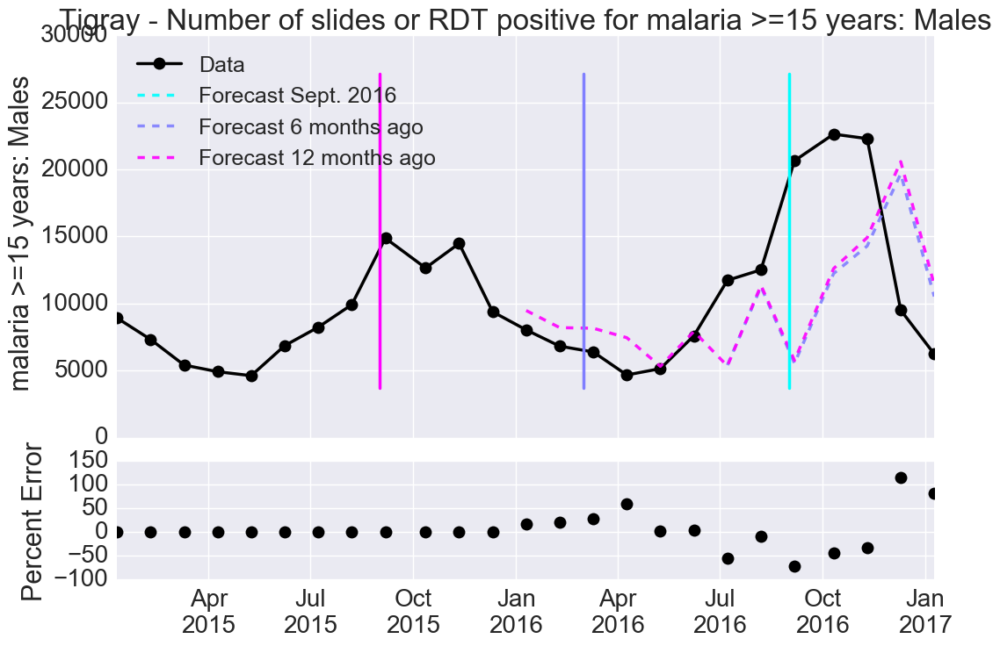

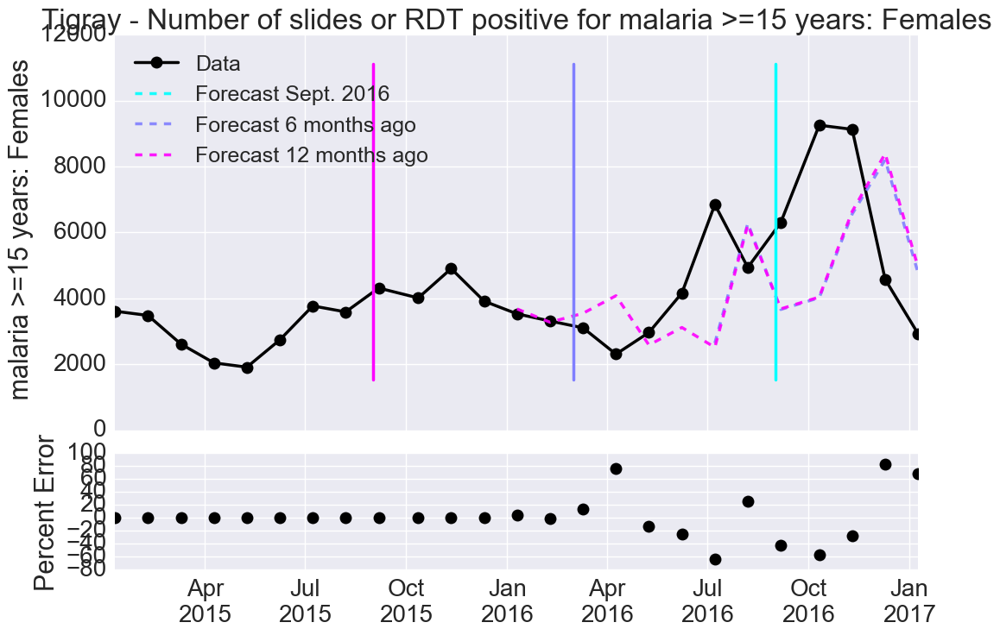

In [77]:
#RMSE_zone = plot_testing(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2006, horz_line = (2016,9), logscale = False)

horz_lines = [(2016, 12 - (M-1)), (2016, 6 - (M-1)), (2015, 12 - (M-1)), (2015, 6 - (M-1))][:len(pred_shifts)]
#horz_lines = [(2016, 11), (2016, 5), (2015, 11), (2015, 5)][:len(pred_shifts)]
training_end = (end_date.year, end_date.month - 1)
#plotting_df = DF_shift_region
plotting_df = DF_shift_all

pred_text = ['Forecast Sept. 2016', 'Forecast 6 months ago', 'Forecast 12 months ago']

regions = DF_shift.groupby('Region').count().index


for indicator in indicators:
    to_plot, predict_plot, RMSE_n = plot_testings_nation(plotting_df, indicator, date_type='Real_Date', val_name='val',\
                    pred_name = 'prediction', pred_shifts=pred_shifts, training_end = training_end,  \
                    horz_lines = horz_lines, cf_band=False, cmap=cm.cool, \
                    title = 'National - %s' % (indicator), pred_text=pred_text)
    plt.savefig('%s/nation_%s.png' % (savedir, indicator))

    # training end is (2009, 3) for one month forecasts
for region in regions:
    for indicator in indicators:
        to_plot, predict_plot, RMSE_n = plot_testings_nation(plotting_df[plotting_df['Region']==region], \
                        indicator, date_type='Real_Date', val_name='val',\
                        pred_name = 'prediction', pred_shifts=pred_shifts, training_end = training_end,  \
                        horz_lines = horz_lines, cf_band=False, cmap=cm.cool, \
                        title= '%s - %s' % (region.title(), indicator), pred_text=pred_text)
        plt.savefig('%s/%s_%s.png' % (savedir, region, indicator))


<h1> Get the data frame ending at the latest test date </h1>

In [140]:
generate_shifts(things_to_shift, 2)

{'humid_avg': 'humid_avg_shift_2',
 'humid_avg_shift_1': 'humid_avg_shift_3',
 'humid_avg_shift_2': 'humid_avg_shift_4',
 'humid_avg_shift_3': 'humid_avg_shift_5',
 'humid_avg_shift_4': 'humid_avg_shift_6',
 'infection_rate': 'infection_rate_shift_2',
 'infection_rate_shift_1': 'infection_rate_shift_3',
 'infection_rate_shift_2': 'infection_rate_shift_4',
 'infection_rate_shift_3': 'infection_rate_shift_5',
 'infection_rate_shift_4': 'infection_rate_shift_6',
 'precipitation': 'precipitation_shift_2',
 'precipitation_shift_1': 'precipitation_shift_3',
 'precipitation_shift_2': 'precipitation_shift_4',
 'precipitation_shift_3': 'precipitation_shift_5',
 'precipitation_shift_4': 'precipitation_shift_6',
 'sg_val': 'sg_val_shift_2',
 'sg_val_shift_1': 'sg_val_shift_3',
 'sg_val_shift_2': 'sg_val_shift_4',
 'sg_val_shift_3': 'sg_val_shift_5',
 'sg_val_shift_4': 'sg_val_shift_6',
 'solar': 'solar_shift_2',
 'solar_shift_1': 'solar_shift_3',
 'solar_shift_2': 'solar_shift_4',
 'solar_shift_3

<h3> functions </h3>

In [138]:
def generate_shifts(columns, months=1, width=3):
    name_maps = {}
    for column in columns:
        for i, j in enumerate(range(months, 2*months + width)):
            # Shift one more time to rename shift_3 as shift_4, prevents duplicate column name
            original_name = column if i==0 else '%s_shift_%s' % (column, i)
            new_name = '%s_shift_%s' % (column, j)
            name_maps.update({original_name: new_name})
    return name_maps

input: end_date, features, times_to_shift


In [114]:
things_to_shift = ['val'] + list({feature.split('_shift')[0] for feature in features if '_shift' in feature})
times_to_shift = 3

latest_test_df = pd.concat(tests[0])
last_rows = latest_test_df[latest_test_df['E_Date'] == end_date].reset_index()
last_rows.rename(columns=generate_shifts(things_to_shift, times_to_shift), inplace=True)
last_rows['E_Date'] = last_rows['E_Date'].apply(lambda x: x + pd.offsets.relativedelta(months=1))
# replace Real_Date with incremented E_Date
last_rows['Real_Date'] = [ethiopian_date.EthiopianDateConverter.date_to_gregorian(date) for date in last_rows['E_Date']]
last_rows['E_year'] = [val.year for val in last_rows['E_Date']]
last_rows['E_month'] = [val.month for val in last_rows['E_Date']]
last_rows['month'] = [val.year for val in last_rows['Real_Date']]
last_rows['year'] = [val.year for val in last_rows['Real_Date']]
# Update onehot month
cur_emonth = last_rows['E_month'].max()
for onehot_month in emonth_list:
    if int(onehot_month.split('_')[-1]) == cur_emonth:
        last_rows[onehot_month] = 1
    else:
        last_rows[onehot_month] = 0
# Make predictions:
x_forecast = last_rows[features].values
last_rows['prediction'] = check_neg(RF.predict(x_forecast))

<h1> Update month, E month and one hot encoding </h1>

<h3> add error </h3>

In [109]:
def add_rmse(dataframe, region_rmse)
    rmse_df = pd.DataFrame(region_rmse['region_rmse_m12']).reset_index().rename(columns= {0: 'rmse'})
    dataframe = dataframe.merge(rmse_df, how='left', on=['Region', 'Indicator'])
    dataframe['pred']
    return dataframe.merge(rmse_df, how='left', on=['Region', 'Indicator'])

<h1> Prediction of the final month that exists in the data </h1>

In [203]:
latest_test_df = pd.concat(tests[0])
latest_test_df = latest_test_df[latest_test_df['E_Date'] == latest_test_df['E_Date'].max()]
latest_test_df[latest_test_df['Region'] == 'addis ababa'][['Real_Date', 'val', 'prediction']]

,Real_Date,val,prediction
774,2017-01-09,3.0,3.498304
805,2017-01-09,2.0,2.134756
836,2017-01-09,18.0,15.208304
867,2017-01-09,9.0,9.273364
898,2017-01-09,119.0,160.868772
929,2017-01-09,45.0,78.808045


## 

<h1> Write to json or cvs </h1>

<h1> Canonical region information mapping </h1>

In [35]:
DF_region_map = pd.read_csv('/Users/attiladobi/zenysis/pipeline/auto/ethiopia/bin/shared/data/region_mapped.csv', \
                           float_precision='high', dtype={'RegionLat': np.float128, 'RegionLon': np.float128})
DF_region_map['RegionName_lower'] = [name.lower() for name in DF_region_map['RegionName']]
DF_region_map.set_index('RegionName_lower', inplace=True)
                                     

In [36]:
DF_region_map

,RegionName,RegionLat,RegionLon,match_0,match_1,match_2,match_3,match_4,match_5,match_6,match_7,match_8,match_9,match_10,match_11,match_12,match_13,match_14,match_15
RegionName_lower,,,,,,,,,,,,,,,,,,,
addis ababa,Addis Ababa,8.980483,38.785538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
afar,Afar,12.036445,40.772735,Affar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amhara,Amhara,11.564952,38.043536,amhara ( 03 ),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
benishangul-gumuz,Benishangul-Gumuz,10.502924,35.440307,b/g,beneshangul,beneshangul gumu,beneshangul gumuz,beni shangul,benishangul,benishangul gumuz,benishangul gumz,benishangul-gumz,benishangule,benshangul,benshangul gumuz,benshangule gumuz,bgumuz,NaN,NaN
dire dawa,Dire Dawa,9.606269,42.003027,dere dawa,diredewa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gambella,Gambella,7.683850,34.336754,gamb.,gambela,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
harari,Harari,9.289660,42.172526,harar,hareri,harreri,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
oromiya,Oromiya,7.323567,38.660525,ormoia,oromia,oromya,oromyia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
snnpr,SNNPR,6.465809,36.806469,s.n.n.p.r,snnp,snnprs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
pd.options.display.float_format = '{:20,.5f}'.format
DF_region_map['RegionLat'].astype(np.float128)

RegionName_lower
addis ababa                      8.98048
afar                            12.03645
amhara                          11.56495
benishangul-gumuz               10.50292
dire dawa                        9.60627
gambella                         7.68385
harari                           9.28966
oromiya                          7.32357
snnpr                            6.46581
somali                           6.93278
tigray                          13.77711
Name: RegionLat, dtype: float128

In [38]:
lat_lon_map = { 'Addis Ababa': (8.980483001254077, 38.78553834507309), 
'Afar': (12.036445063176075, 40.772735414805204),
'Amhara': (11.5649524790046, 38.04353615460529),
'Benishangul-Gumuz': (10.502924415157686, 35.44030701966273),
'Dire Dawa': (9.606269193503696, 42.003026894902156),
'Gambella':(7.683850454124325, 34.33675414861345),
'Harari': (9.289660023774802, 42.172525872858124),
'Oromiya': (7.323567398452454, 38.66052453790127),
'Somali': (6.932778405509416, 43.32988331430246),
'SNNPR': (6.465808724769859, 36.806469462905675),
'Tigray': (13.777114742142253, 38.43867332133363 ),  
}    
    

<h1> format the data into json for injestion </h1>

<h1> save projection and previous forecast to json </h1>

In [40]:
proj_start_date = projection_DF['Real_Date'].min()
projection_DF = projection_DF[projection_DF['Real_Date'] > proj_start_date]
DF_testing = DF_testing[DF_testing['Real_Date'] <= proj_start_date]

dataframes = [projection_DF, DF_testing]
pred_texts = ['prediction', 'prediction_m_12']
sources = ['forecast', 'forecast']

from collections import OrderedDict
with open("forecast.json", "w") as outfile:    
    for dataframe, pred_text, source in zip(dataframes, pred_texts, sources):
        #... Add try except
        dataframe.set_index('Real_Date', inplace=True)

        Formatted_DF = dataframe[['val', pred_text,  'Region', 'Indicator_id']].rename(columns = \
                                        {'Indicator_id': 'field', 'Region': 'RegionName'})

        Formatted_DF['RegionName'] = [region if region != 'harreri' else 'harari' for region in Formatted_DF['RegionName']]
        Formatted_DF['field'] = ['forecast_%s' % (field) for field in Formatted_DF['field']]
        Formatted_DF.index = pd.DatetimeIndex(Formatted_DF.index)

        # Overwrite the lowercased region name with the canonical value
        Formatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]

        Formatted_DF['source'] ='forecast'
        Formatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]

        # Write to json
        for line in Formatted_DF.iterrows():
            line = line[1]
            region = line['RegionName']
            json.dump(OrderedDict([('Real_Date', line['Real_Date']), ('RegionName', region), \
                       ('val', line[pred_text]), ('field', line['field']), \
                       ('source', source), ('RegionLat', lat_lon_map[region][0]), \
                       ('RegionLon', lat_lon_map[region][1])]), outfile)
            outfile.write('\n')

In [57]:
# only forecast_DF
# only ext
Formatted_DF = ext_DF[['val', 'prediction',  'Region', 'Indicator_id']].rename(columns = \
                                {'Indicator_id': 'field', 'Region': 'RegionName'})
#Harreri update
#Formatted_DF.loc[Formatted_DF['RegionName'] == 'harreri']['RegionName'] = 'harari'

Formatted_DF['RegionName'] = [region if region != 'harreri' else 'harari' for region in Formatted_DF['RegionName']]

Formatted_DF['field'] = ['forecast_%s' % (field) for field in Formatted_DF['field']]
Formatted_DF.index = pd.DatetimeIndex(Formatted_DF.index)


# Overwrite the lowercased region name with the canonical value
Formatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]

Formatted_DF['source'] ='forecast'
Formatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]

'''
Formatted_DF['RegionLat'] = [DF_region_map.loc[region]['RegionLat'] for region in Formatted_DF['RegionName']]
Formatted_DF['RegionLon'] = [DF_region_map.loc[region]['RegionLon'] for region in Formatted_DF['RegionName']]
#finally overwrite the lowercased region name with the canonical value
Formatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]

Formatted_DF['source'] ='forecast'
Formatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]

Formatted_DF['RegionLat'] = [lat_lon_map[region][0] for region in Formatted_DF['RegionName']]
Formatted_DF['RegionLon'] = [lat_lon_map[region][1] for region in Formatted_DF['RegionName']]
'''

"\nFormatted_DF['RegionLat'] = [DF_region_map.loc[region]['RegionLat'] for region in Formatted_DF['RegionName']]\nFormatted_DF['RegionLon'] = [DF_region_map.loc[region]['RegionLon'] for region in Formatted_DF['RegionName']]\n#finally overwrite the lowercased region name with the canonical value\nFormatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]\n\nFormatted_DF['source'] ='forecast'\nFormatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]\n\nFormatted_DF['RegionLat'] = [lat_lon_map[region][0] for region in Formatted_DF['RegionName']]\nFormatted_DF['RegionLon'] = [lat_lon_map[region][1] for region in Formatted_DF['RegionName']]\n"

In [2594]:
#Formatted_DF['val'] = Formatted_DF['val'].map(lambda x: float(x))

Formatted_DF.to_csv('Malaria_Forecast_2009.csv')
Formatted_DF.to_json('Malaria_Forecast_2009.json', orient='records', double_precision=15)


In [89]:
Formatted_DF

,val,RegionName,field,source,Real_Date
Real_Date,,,,,
2014-09-06,183.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-09-06
2014-10-11,240.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-10-11
2014-11-10,206.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-11-10
2014-12-10,232.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-12-10
2015-01-09,284.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-01-09
2015-02-08,196.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-02-08
2015-03-10,293.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-03-10
2015-04-09,386.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-04-09
2015-05-09,275.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-05-09


<h1> Write to json </h1>

In [59]:
#write to json
from collections import OrderedDict
with open("forecast.json", "w") as outfile:
    for line in Formatted_DF.iterrows():
        line = line[1]
        region = line['RegionName']
        json.dump(OrderedDict([('Real_Date', line['Real_Date']), ('RegionName', region), \
                   ('val', line['prediction']), ('field', line['field']), \
                   ('source', 'forecast'), ('RegionLat', lat_lon_map[region][0]), \
                   ('RegionLon', lat_lon_map[region][1])]), outfile)
        outfile.write('\n')

<h1> save to csv file </h1>

In [ ]:
with open('forecast.json', 'wb') as f:
        # Assuming that all dictionaries in the list have the same keys.
        headers = ['Real_Date', 'RegionName', 'val', 'val_lower', 'val_upper', 'field', 'source', 'RegionLat', 'RegionLon']
        csv_data = [headers]

        for line in Formatted_DF.iterrows():
            line = line[1]
            region = line['RegionName']
            data = [line['Real_Date'], \
                    region, \
                    line['val'], line['val_lower'], line['val_upper'],\
                    line['field'], \
                    'forecast', \
                    lat_lon_map[region][0], \
                    lat_lon_map[region][1]]
            csv_data.append(data)

        writer = csv.writer(f)
        writer.writerows(csv_data)

In [ ]:
def forecast(DF_test, RF, n_months=12):
    '''Pass in DF_shift to start from last month in the data or DF_training to start at last training month
    also specify the number of months to project (n_months = 12)
    Return the extended data frame'''
    
    # Initialize empty dataframe for projection
    ext_DF = pd.DataFrame()
    forecast_DF = pd.DataFrame()
    
    # set the index to Region and Ethiopian date and sort the date index
    DF_test = DF_test.reset_index().set_index(['Indicator_id', 'Region','E_Date']).sort_index(axis=0, level=[0, 1, 2])
    
    for indicator in DF_test.index.levels[0]:
        for region in DF_test.index.levels[1]:

            DF_temp = DF_test.loc[indicator].loc[region]
            
            is_first = True

            for xx in range(n_months+1):
                last_entry = DF_temp.tail(1).reset_index()
                
                if is_first:
                    start_date = last_entry['E_Date'][0]
                    is_first = False

                x = last_entry[features].values.reshape(1,-1)

                # predict new value and CF band:
                new_val = RF.predict(x)
                err_down, err_up = pred_ints(RF, x, percentile=90)
                
                last_entry['val'] = new_val
                last_entry['val_lower'] = err_down
                last_entry['val_upper'] = err_up
                # The predicted values also go in the prediction column
                # Which was the one month out forecast before the training date
                last_entry['prediction'] = new_val
                last_entry['prediction_lower'] = err_down
                last_entry['prediction_upper'] = err_up

                # increment date
                # add one month
                last_entry['E_Date'] = last_entry['E_Date'][0] + pd.offsets.relativedelta(months=1)
                last_entry.set_index('E_Date', inplace=True)

                # replace Real_Date with incremented E_Date
                last_entry['Real_Date'] = ethiopian_date.EthiopianDateConverter.date_to_gregorian(last_entry.index[0])

                last_entry.reset_index(inplace = True)

                last_entry['E_year'] = last_entry['E_Date'][0].year
                last_entry['E_month'] = last_entry['E_Date'][0].month
                last_entry['month'] = last_entry['Real_Date'][0].month
                last_entry['year'] = last_entry['Real_Date'][0].year

                #update current weather info

                last_entry['temp'] = [DF_weather.loc[capital,'temp'][inv_month_map[month]] for capital,month in zip(last_entry['capital'],last_entry['month'])]
                last_entry['prec_mm'] = [DF_weather.loc[capital,'prec_mm'][inv_month_map[month]] for capital,month in zip(last_entry['capital'],last_entry['month'])]
                last_entry['prec_mm'] = last_entry['prec_mm'].replace(nan,0)

                # The hard part... add the extrapolations 

                last_entry['val_shift_1'] = DF_temp.iloc[-1]['val']
                last_entry['temp_shift_1'] = DF_temp.iloc[-1]['temp']
                last_entry['prec_shift_1'] = DF_temp.iloc[-1]['prec_mm']
                #DF_ext['Region_shift_1'] = DF_temp.iloc[-1]['Region']
                #DF_ext['Ind_shift_1'] = DF_temp.iloc[-1]['Indicator']
                last_entry['temp_delta'] = last_entry['temp'] - DF_temp.iloc[-1]['temp_shift_1']
                last_entry['prec_delta'] = last_entry['prec_mm'] - DF_temp.iloc[-1]['prec_shift_1']

                last_entry['val_shift_2'] = DF_temp.iloc[-2]['val']
                last_entry['temp_shift_2'] = DF_temp.iloc[-2]['temp']
                last_entry['prec_shift_2'] = DF_temp.iloc[-2]['prec_mm']
                #last_entry['Region_shift_2'] = DF_ext.shift(2)['Region']
                #last_entry['Ind_shift_2'] = DF_ext.shift(2)['Indicator']
                last_entry['val_delta'] =  (last_entry['val_shift_1'] - last_entry['val_shift_2']) / last_entry['val_shift_2']

                # tack on to the end of the DF
                last_entry.set_index('E_Date', inplace = True)
                DF_temp = DF_temp.append(last_entry)

            # add back the region name   
            DF_temp['Indicator_id'] = indicator
            DF_temp['Region'] = region
            ext_DF = pd.concat([ext_DF, DF_temp])
            forecast_DF = pd.concat([forecast_DF, DF_temp[DF_temp.index > start_date] ]) #Index is E_Date

    ext_DF.reset_index(inplace = True)   
    ext_DF.set_index('Real_Date', inplace = True)
    forecast_DF.reset_index(inplace = True) 
    forecast_DF.set_index('Real_Date', inplace = True)
    
    return ext_DF, forecast_DF